## Multi- Class Classification



In [1]:
# File: multi-class-classification.ipynb
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from patsy.user_util import balanced

from Lab_Test.Lab_Test import accuracy

In [2]:
# Read the CSV Files
df = pd.read_csv('mobile_dataset.csv')
df.head(5) # Display the first 5 rows of the dataset

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20.0,756,2549.0,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905.0,1988,2631.0,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263.0,1716,2603.0,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216.0,1786,2769.0,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208.0,1212,1411.0,8,2,15,1,1,0,1


In [3]:
# Check the files whether they have any empty cell or not
df.isnull().sum()

battery_power     0
blue              0
clock_speed       0
dual_sim          0
fc                0
four_g            0
int_memory        0
m_dep             0
mobile_wt         0
n_cores           0
pc                0
px_height        88
px_width          0
ram              94
sc_h              0
sc_w              0
talk_time         0
three_g           0
touch_screen      0
wifi              0
price_range       0
dtype: int64

In [4]:
df["price_range"].value_counts() # Display the count of each class in the target variable

price_range
1    766
0    758
2    752
3    724
Name: count, dtype: int64

In [5]:
df.dtypes

battery_power      int64
blue               int64
clock_speed      float64
dual_sim           int64
fc                 int64
four_g             int64
int_memory         int64
m_dep            float64
mobile_wt          int64
n_cores            int64
pc                 int64
px_height        float64
px_width           int64
ram              float64
sc_h               int64
sc_w               int64
talk_time          int64
three_g            int64
touch_screen       int64
wifi               int64
price_range        int64
dtype: object

In [6]:
# Median imputation
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy='mean')
df[['px_height', 'ram']] = imputer.fit_transform(df[['px_height', 'ram']])
df.isnull().sum()

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

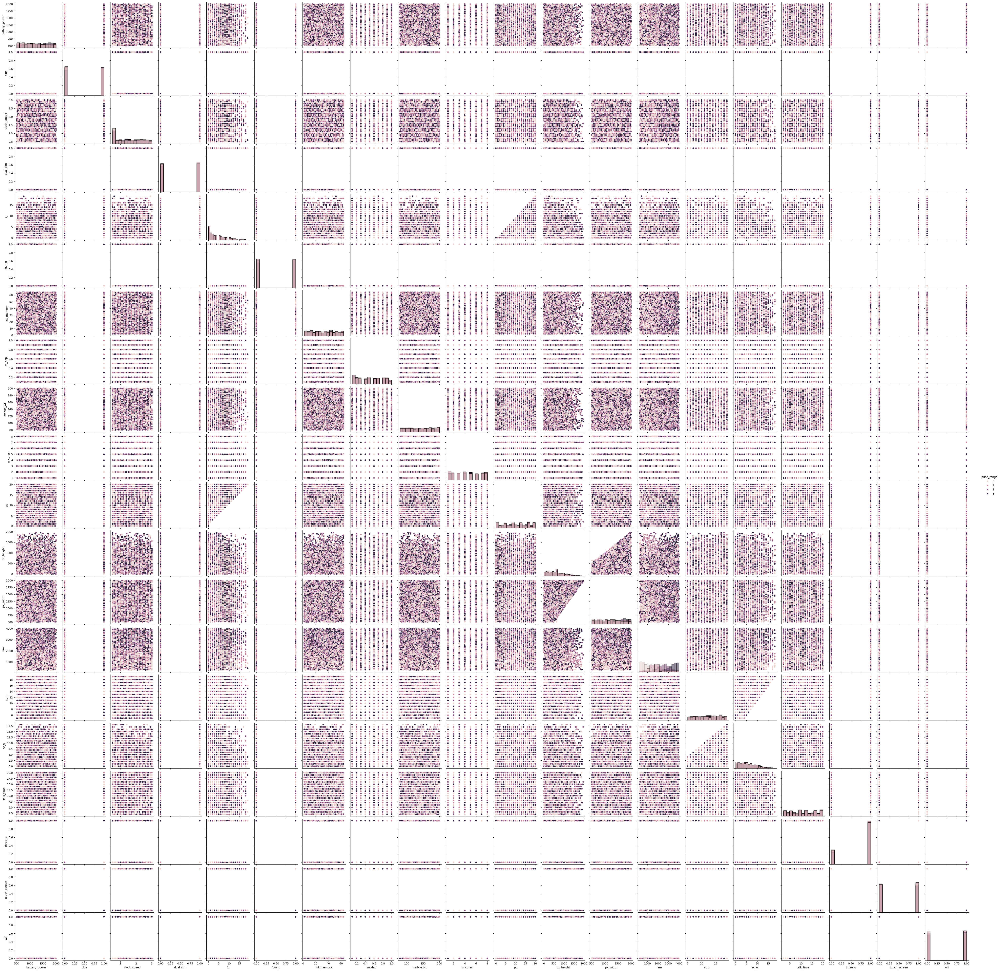

In [ ]:
sns.pairplot(df, hue='price_range', diag_kind='kde')

<Axes: >

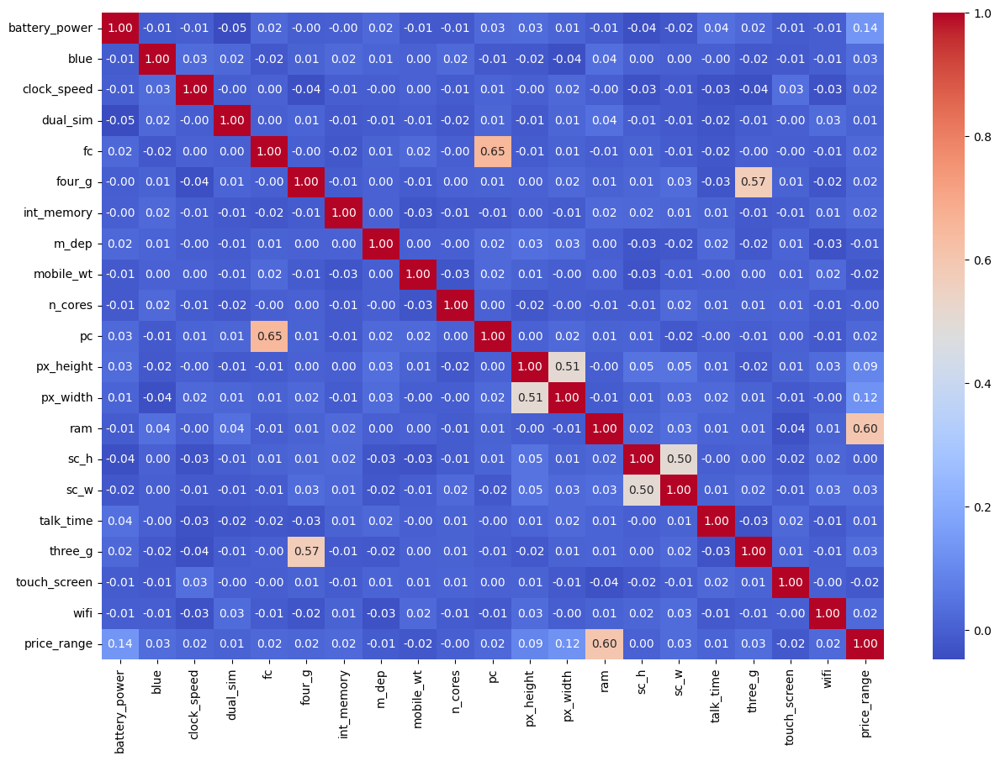

In [29]:
df.corr()
plt.figure(figsize=(15, 10))     
sns.heatmap(df.corr(), annot=True, fmt=".2f", cmap='coolwarm')

In [7]:
# import the required libraries for modelling and evluation for one classifier. We will import more on need basis.
import sklearn
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix ##

In [56]:
# importing the required libraries for logistic regression


# split the data in X and y
X = df[["ram","battery_power","px_height","px_width"]]
y = df["price_range"]

from sklearn.preprocessing import StandardScaler
SS= StandardScaler()
scaled_X= SS.fit_transform(X) 


#Split the Data into training and test set
X_train, X_test, y_train, y_test = train_test_split(scaled_X, y, test_size = 0.1, random_state= 42)
 


In [59]:
LR = LogisticRegression(solver=  'lbfgs', max_iter=300)

LR.fit(X_train, y_train)

y_preds = LR.predict(X_test)


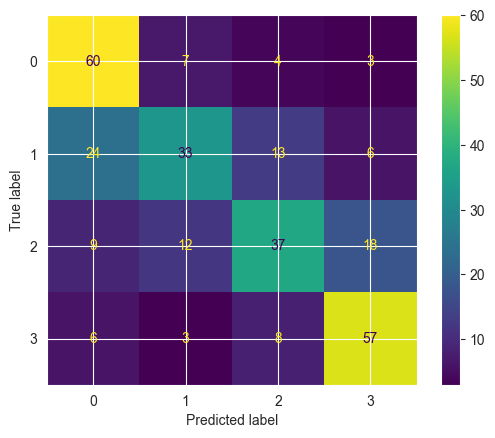

In [50]:
#Confusion Matrix for Logistic Regression
CM = confusion_matrix(y_test, y_preds)
ConfusionMatrixDisplay(CM).plot();

In [60]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score


print("Accuracy: ", accuracy_score(y_test, y_preds))
print("Precision: ", precision_score(y_test, y_preds, average=None))        
print("Recall: ", recall_score(y_test, y_preds, average=None))
print("F1 Score: ", f1_score(y_test, y_preds, average=None))

Accuracy:  0.6366666666666667
Precision:  [0.59405941 0.63461538 0.65079365 0.67857143]
Recall:  [0.81081081 0.43421053 0.53947368 0.77027027]
F1 Score:  [0.68571429 0.515625   0.58992806 0.72151899]


In [66]:
# Example new data points
new_data = np.array([[1866,862,1864,568]])

# Normalize the new data
new_data_scaled = SS.transform(new_data)

# Make predictions
new_predictions = LR.predict(new_data_scaled)

print("Predictions for new data points:", new_predictions)

Predictions for new data points: [1]


C:\Users\1212a\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


In [37]:
df = pd.read_csv('dataset.csv')
df.head(5) # Display the first 5 rows of the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   preg    768 non-null    int64  
 1   glu     768 non-null    int64  
 2   bp      768 non-null    int64  
 3   skin    768 non-null    int64  
 4   ins     768 non-null    int64  
 5   bmi     768 non-null    float64
 6   ped     768 non-null    float64
 7   age     768 non-null    int64  
 8   target  768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [39]:
df.to_csv('diabetes_dataset.csv', index=False) # Save the DataFrame to a CSV file without the index